<a href="https://colab.research.google.com/github/yashwanthbooram/Ship-Detection-in-Satellite-Imagery-using-Deep-Learning/blob/main/Ship_Detection_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# @title
# Mount Google Drive to access Kaggle credentials
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
from google.colab import drive
drive.mount('/content/drive')

!unzip "/content/drive/My Drive/hrsc2016.zip" -d HRSC2016

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Archive:  /content/drive/My Drive/hrsc2016.zip
  inflating: HRSC2016/HRSC2016_dataset.zip  


In [3]:
!unzip "HRSC2016/HRSC2016_dataset.zip" -d HRSC2016

Archive:  HRSC2016/HRSC2016_dataset.zip
 extracting: HRSC2016/AnnotationTool_v2.rar  
 extracting: HRSC2016/dev-tools.rar  
 extracting: HRSC2016/HRSC2016.part01.rar  
 extracting: HRSC2016/HRSC2016.part02.rar  
 extracting: HRSC2016/HRSC2016.part03.rar  
 extracting: HRSC2016/HRSC2016.part04.rar  
 extracting: HRSC2016/HRSC2016.part05.rar  
 extracting: HRSC2016/ShipTeam_HRSC2016_Introduction.docx  
 extracting: HRSC2016/ShipTeam_HRSC2016_Introduction.pdf  
 extracting: HRSC2016/SOA_Results.rar  
 extracting: HRSC2016/State_Of_The_Art_Codes.rar  


In [4]:
!apt-get install unrar-free

%cd HRSC2016

!unrar x HRSC2016.part01.rar

%cd ..

!ls -la HRSC2016

Streaming output truncated to the last 5000 lines.
Extracting  HRSC2016/FullDataSet/AllImages/100001571.bmp                  54%  OK 
Extracting  HRSC2016/FullDataSet/AllImages/100001572.bmp                  54%  OK 
Extracting  HRSC2016/FullDataSet/AllImages/100001573.bmp                  54%  OK 
Extracting  HRSC2016/FullDataSet/AllImages/100001574.bmp                  54%  OK 
Extracting  HRSC2016/FullDataSet/AllImages/100001575.bmp                  54%  OK 
Extracting  HRSC2016/FullDataSet/AllImages/100001576.bmp                  54%  OK 
Extracting  HRSC2016/FullDataSet/AllImages/100001577.bmp                  54%  OK 
Extracting  HRSC2016/FullDataSet/AllImages/100001578.bmp                  54%  OK 
Extracting  HRSC2016/FullDataSet/AllImages/100001579.bmp                  54%  OK 
Extracting  HRSC2016/FullDataSet/AllImages/100001580.bmp                  54%  OK 
Extracting  HRSC2016/FullData

In [5]:
!ls -la HRSC2016

total 7299632
drwxr-xr-x 3 root root       4096 Apr 21 11:32 .
drwxr-xr-x 1 root root       4096 Apr 21 11:30 ..
-rw-r--r-- 1 root root  139864879 Aug 22  2018 AnnotationTool_v2.rar
-rw-r--r-- 1 root root  125895790 Aug 22  2018 dev-tools.rar
drwxr-xr-x 6 root root       4096 Nov 30  2016 HRSC2016
-rw-r--r-- 1 root root 3737383213 Nov 21  2019 HRSC2016_dataset.zip
-rw-r--r-- 1 root root  734003200 Aug 22  2018 HRSC2016.part01.rar
-rw-r--r-- 1 root root  734003200 Aug 22  2018 HRSC2016.part02.rar
-rw-r--r-- 1 root root  734003200 Aug 22  2018 HRSC2016.part03.rar
-rw-r--r-- 1 root root  734003200 Aug 22  2018 HRSC2016.part04.rar
-rw-r--r-- 1 root root  258702121 Aug 22  2018 HRSC2016.part05.rar
-rw-r--r-- 1 root root    5838584 Aug 22  2018 ShipTeam_HRSC2016_Introduction.docx
-rw-r--r-- 1 root root    3416888 Aug 22  2018 ShipTeam_HRSC2016_Introduction.pdf
-rw-r--r-- 1 root root  252064210 Aug 22  2018 SOA_Results.rar
-rw-r--r-- 1 root root   15586209 Aug 22  2018 State_Of_The_Art_Codes.

In [6]:
!ls -la HRSC2016/HRSC2016

total 24
drwxr-xr-x 6 root root 4096 Nov 30  2016 .
drwxr-xr-x 3 root root 4096 Apr 21 11:32 ..
drwxr-xr-x 6 root root 4096 Nov 30  2016 FullDataSet
drwxr-xr-x 2 root root 4096 Nov 30  2016 ImageSets
drwxr-xr-x 6 root root 4096 Nov 30  2016 Test
drwxr-xr-x 6 root root 4096 Nov 30  2016 Train


In [7]:
!ls -la HRSC2016/HRSC2016/FullDataSet

total 240
drwxr-xr-x 6 root root  4096 Nov 30  2016 .
drwxr-xr-x 6 root root  4096 Nov 30  2016 ..
drwxr-xr-x 2 root root 69632 Nov 30  2016 AllImages
drwxr-xr-x 2 root root 69632 Nov 30  2016 Annotations
drwxr-xr-x 2 root root  4096 Nov 30  2016 LandMask
drwxr-xr-x 2 root root 20480 Nov 30  2016 Segmentations
-rw-r--r-- 1 root root 71392 Jul 28  2016 sysdata.xml


#**Part 1 Setup and Dataset Path Verification**



This code cell imports necessary libraries for the ship detection project, sets up paths to the HRSC2016 dataset, and verifies the existence of image and annotation directories. It also defines a function to parse XML annotation files that extract bounding box coordinates for ships in satellite imagery. The code checks the dataset structure and provides feedback on the availability of required directories.

In [8]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
from PIL import Image
import cv2
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Input, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.utils import to_categorical
import glob

base_path = 'HRSC2016/HRSC2016'
full_dataset_path = os.path.join(base_path, 'FullDataSet')

!ls -la {full_dataset_path}

images_path = os.path.join(full_dataset_path, 'AllImages')
annotations_path = os.path.join(full_dataset_path, 'Annotations')

print(f"Images path exists: {os.path.exists(images_path)}")
print(f"Annotations path exists: {os.path.exists(annotations_path)}")

if not os.path.exists(images_path) or not os.path.exists(annotations_path):
    print("Searching for image and annotation directories...")
    for root, dirs, files in os.walk(base_path):
        if 'AllImages' in dirs or 'Images' in dirs or 'JPEGImages' in dirs:
            print(f"Potential images directory found: {root}")
        if 'Annotations' in dirs or 'XML' in dirs:
            print(f"Potential annotations directory found: {root}")

def parse_annotation(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()

    img_width = int(root.find('.//Img_SizeWidth').text)
    img_height = int(root.find('.//Img_SizeHeight').text)

    boxes = []
    for obj in root.findall('.//HRSC_Objects/HRSC_Object'):
        xmin = int(float(obj.find('box_xmin').text))
        ymin = int(float(obj.find('box_ymin').text))
        xmax = int(float(obj.find('box_xmax').text))
        ymax = int(float(obj.find('box_ymax').text))

        xmin = max(0, xmin)
        ymin = max(0, ymin)
        xmax = min(img_width, xmax)
        ymax = min(img_height, ymax)

        boxes.append([xmin, ymin, xmax, ymax])

    return boxes, img_width, img_height

total 240
drwxr-xr-x 6 root root  4096 Nov 30  2016 .
drwxr-xr-x 6 root root  4096 Nov 30  2016 ..
drwxr-xr-x 2 root root 69632 Nov 30  2016 AllImages
drwxr-xr-x 2 root root 69632 Nov 30  2016 Annotations
drwxr-xr-x 2 root root  4096 Nov 30  2016 LandMask
drwxr-xr-x 2 root root 20480 Nov 30  2016 Segmentations
-rw-r--r-- 1 root root 71392 Jul 28  2016 sysdata.xml
Images path exists: True
Annotations path exists: True


 Import Libraries and Setup


In [9]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
from PIL import Image
import cv2
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Input, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.utils import to_categorical
import glob


# **Part 2:Dataset Path Configuration and Annotation Parsing**

This code cell sets up the paths to the HRSC2016 dataset and defines a function to parse XML annotation files. The function extracts bounding box coordinates for ships in satellite imagery.

In [10]:

base_path = 'HRSC2016/HRSC2016'
images_path = os.path.join(base_path, 'FullDataSet/AllImages')
annotations_path = os.path.join(base_path, 'FullDataSet/Annotations')

def parse_annotation(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()

    img_width = int(root.find('.//Img_SizeWidth').text)
    img_height = int(root.find('.//Img_SizeHeight').text)

    boxes = []
    for obj in root.findall('.//HRSC_Objects/HRSC_Object'):
        xmin = int(float(obj.find('box_xmin').text))
        ymin = int(float(obj.find('box_ymin').text))
        xmax = int(float(obj.find('box_xmax').text))
        ymax = int(float(obj.find('box_ymax').text))

        xmin = max(0, xmin)
        ymin = max(0, ymin)
        xmax = min(img_width, xmax)
        ymax = min(img_height, ymax)

        boxes.append([xmin, ymin, xmax, ymax])

    return boxes, img_width, img_height


#**Part 3  : Dataset Preparation Function**

This code cell defines the prepare_dataset function which creates a balanced dataset for ship detection. It processes XML annotation files to find images containing ships and also creates negative samples (regions without ships) from the same images. The function returns paths to image regions and their corresponding labels (1 for ship, 0 for no ship).

In [11]:

def prepare_dataset(img_size=(224, 224)):
    image_paths = []
    labels = []

    annotation_files = glob.glob(os.path.join(annotations_path, '*.xml'))
    print(f"Found {len(annotation_files)} annotation files")

    for xml_file in annotation_files:
        img_file = os.path.join(images_path, os.path.basename(xml_file).replace('.xml', '.jpg'))

        if not os.path.exists(img_file):
            img_file = os.path.join(images_path, os.path.basename(xml_file).replace('.xml', '.bmp'))
            if not os.path.exists(img_file):
                continue

        boxes, img_width, img_height = parse_annotation(xml_file)

        if len(boxes) > 0:
            image_paths.append(img_file)
            labels.append(1)

            img = cv2.imread(img_file)
            if img is None:
                continue

            h, w, _ = img.shape

            if h > img_size[0]*2 and w > img_size[1]*2:
                for _ in range(10):
                    x = np.random.randint(0, w - img_size[1])
                    y = np.random.randint(0, h - img_size[0])

                    overlap = False
                    for box in boxes:
                        if (x < box[2] and x + img_size[1] > box[0] and
                            y < box[3] and y + img_size[0] > box[1]):
                            overlap = True
                            break

                    if not overlap:
                        image_paths.append((img_file, (x, y, x + img_size[1], y + img_size[0])))
                        labels.append(0)
                        break

    return image_paths, labels

#**Part 4: Image Loading and Preprocessing Function**

This code cell defines the load_images function which loads and preprocesses images for the neural network.
It handles both full images and cropped regions (negative samples), resizes them to a standard size, converts from BGR to RGB color space, and normalizes pixel values to the range [0,1].
The function returns arrays of preprocessed images and their corresponding labels.



In [12]:


def load_images(image_paths, labels, img_size=(224, 224)):
    X = []
    y = []

    for i, (img_path, label) in enumerate(zip(image_paths, labels)):
        try:
            if isinstance(img_path, tuple):
                img_file, crop_coords = img_path
                img = cv2.imread(img_file)
                img = img[crop_coords[1]:crop_coords[3], crop_coords[0]:crop_coords[2]]
            else:
                img = cv2.imread(img_path)

            if img is None:
                print(f"Warning: Could not read image {img_path}")
                continue

            img = cv2.resize(img, img_size)

            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            img = img / 255.0

            X.append(img)
            y.append(label)

            if i % 100 == 0:
                print(f"Processed {i}/{len(image_paths)} images")
        except Exception as e:
            print(f"Error processing {img_path}: {e}")

    return np.array(X), np.array(y)


#**Part 5: Dataset Preparation, Model Building and Training Setup**

This code cell handles the complete workflow from dataset preparation to model definition:

Prepares the dataset by calling the prepare_dataset() function and displays statistics about positive and negative samples
Splits the data into training and validation sets using stratified sampling
Loads and preprocesses the images for both training and validation sets
Converts the labels to categorical format for classification
Defines the neural network architecture using a function called build_model()
The model architecture consists of four convolutional blocks with increasing filter sizes (32→64→128→256), each followed by batch normalization and max pooling. The final part includes fully connected layers with dropout for regularization, culminating in a softmax output layer for binary classification (ship vs. no ship).

In [13]:

print("Preparing dataset...")
image_paths, labels = prepare_dataset()
print(f"Total samples: {len(image_paths)}")
print(f"Positive samples (with ships): {sum(labels)}")
print(f"Negative samples (no ships): {len(labels) - sum(labels)}")

train_paths, val_paths, train_labels, val_labels = train_test_split(
    image_paths, labels, test_size=0.2, random_state=42, stratify=labels
)

print("Loading training images...")
X_train, y_train = load_images(train_paths, train_labels)
print("Loading validation images...")
X_val, y_val = load_images(val_paths, val_labels)

y_train = to_categorical(y_train, 2)
y_val = to_categorical(y_val, 2)

def build_model(input_shape=(224, 224, 3)):
    inputs = Input(shape=input_shape)

    # First convolutional block
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    x = BatchNormalization()(x)
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
    x = BatchNormalization()(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)

    # Second convolutional block
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = BatchNormalization()(x)
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = BatchNormalization()(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)

    # Third convolutional block
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = BatchNormalization()(x)
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = BatchNormalization()(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)

    # Fourth convolutional block
    x = Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = BatchNormalization()(x)
    x = Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = BatchNormalization()(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)

    # Flatten and fully connected layers
    x = Flatten()(x)
    x = Dense(512, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    x = Dense(256, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    outputs = Dense(2, activation='softmax')(x)

    model = Model(inputs=inputs, outputs=outputs)
    return model

Preparing dataset...
Found 1681 annotation files
Total samples: 2016
Positive samples (with ships): 1055
Negative samples (no ships): 961
Loading training images...
Processed 0/1612 images
Processed 100/1612 images
Processed 200/1612 images
Processed 300/1612 images
Processed 400/1612 images
Processed 500/1612 images
Processed 600/1612 images
Processed 700/1612 images
Processed 800/1612 images
Processed 900/1612 images
Processed 1000/1612 images
Processed 1100/1612 images
Processed 1200/1612 images
Processed 1300/1612 images
Processed 1400/1612 images
Processed 1500/1612 images
Processed 1600/1612 images
Loading validation images...
Processed 0/404 images
Processed 100/404 images
Processed 200/404 images
Processed 300/404 images
Processed 400/404 images


#**Part 6: Dataset Preparation, Model Building and Training Setup**


This code cell implements functionality to extract and visualize individual ships from the dataset:

1. Defines an extract_and_display_ships function that:
 * Randomly selects annotation files from the dataset
 * Extracts bounding box coordinates for ships in each image
 * Creates cropped images of individual ships with padding
 * Creates visualizations of both the original image (with bounding box) and the extracted ship
 * Organizes these visualizations in a side-by-side comparison
2. Calls the function to extract and display 10 ship samples
3. Saves the visualization to a file and returns the extracted ship images and their original contexts

This functionality provides a clear visual representation of how ships appear in the satellite imagery and how accurately the bounding box annotations capture them. It's useful for understanding the dataset characteristics and for qualitative assessment of the annotation quality.



Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 224, 224, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 112, 112, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 56, 56, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 28, 28, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 28, 28, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 28, 28, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 14, 14, 256)    │             

 Total params: 27,001,634 (103.00 MB)

 Trainable params: 26,998,178 (102.99 MB)

 Non-trainable params: 3,456 (13.50 KB)

Epoch 1/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step - accuracy: 0.7516 - loss: 0.7763
Epoch 1: val_accuracy improved from -inf to 0.47772, saving model to ship_detection_model.h5


51/51 ━━━━━━━━━━━━━━━━━━━━ 57s 612ms/step - accuracy: 0.7524 - loss: 0.7730 - val_accuracy: 0.4777 - val_loss: 3.7706 - learning_rate: 0.0010
Epoch 2/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - accuracy: 0.8968 - loss: 0.2955
Epoch 2: val_accuracy did not improve from 0.47772
51/51 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - accuracy: 0.8970 - loss: 0.2950 - val_accuracy: 0.4777 - val_loss: 5.0267 - learning_rate: 0.0010
Epoch 3/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - accuracy: 0.9371 - loss: 0.1949
Epoch 3: val_accuracy did not improve from 0.47772
51/51 ━━━━━━━━━━━━━━━━━━━━ 9s 170ms/step - accuracy: 0.9370 - loss: 0.1950 - val_accuracy: 0.4777 - val_loss: 3.3326 - learning_rate: 0.0010
Epoch 4/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - accuracy: 0.9388 - loss: 0.1878
Epoch 4: val_accuracy did not improve from 0.47772
51/51 ━━━━━━━━━━━━━━━━━━━━ 10s 166ms/step - accuracy: 0.9389 - loss: 0.1875 - val_accuracy: 0.4777 - val_loss: 4.1809 - learning_rate: 0.0010
Epoch 5/50
51/51 ━━━━━

51/51 ━━━━━━━━━━━━━━━━━━━━ 11s 215ms/step - accuracy: 0.9613 - loss: 0.1131 - val_accuracy: 0.7599 - val_loss: 0.8113 - learning_rate: 0.0010
Epoch 8/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - accuracy: 0.9694 - loss: 0.1037
Epoch 8: val_accuracy did not improve from 0.75990
51/51 ━━━━━━━━━━━━━━━━━━━━ 18s 165ms/step - accuracy: 0.9695 - loss: 0.1036 - val_accuracy: 0.5569 - val_loss: 1.9511 - learning_rate: 0.0010
Epoch 9/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - accuracy: 0.9688 - loss: 0.0859
Epoch 9: val_accuracy improved from 0.75990 to 0.87871, saving model to ship_detection_model.h5


51/51 ━━━━━━━━━━━━━━━━━━━━ 16s 275ms/step - accuracy: 0.9688 - loss: 0.0860 - val_accuracy: 0.8787 - val_loss: 0.6552 - learning_rate: 0.0010
Epoch 10/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - accuracy: 0.9701 - loss: 0.1025
Epoch 10: val_accuracy did not improve from 0.87871
51/51 ━━━━━━━━━━━━━━━━━━━━ 15s 167ms/step - accuracy: 0.9702 - loss: 0.1022 - val_accuracy: 0.6708 - val_loss: 1.4493 - learning_rate: 0.0010
Epoch 11/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - accuracy: 0.9699 - loss: 0.0800
Epoch 11: val_accuracy improved from 0.87871 to 0.96040, saving model to ship_detection_model.h5


51/51 ━━━━━━━━━━━━━━━━━━━━ 13s 231ms/step - accuracy: 0.9699 - loss: 0.0799 - val_accuracy: 0.9604 - val_loss: 0.1711 - learning_rate: 0.0010
Epoch 12/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - accuracy: 0.9692 - loss: 0.0842
Epoch 12: val_accuracy did not improve from 0.96040
51/51 ━━━━━━━━━━━━━━━━━━━━ 17s 168ms/step - accuracy: 0.9693 - loss: 0.0842 - val_accuracy: 0.8738 - val_loss: 0.3970 - learning_rate: 0.0010
Epoch 13/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - accuracy: 0.9877 - loss: 0.0487
Epoch 13: val_accuracy did not improve from 0.96040
51/51 ━━━━━━━━━━━━━━━━━━━━ 10s 168ms/step - accuracy: 0.9876 - loss: 0.0489 - val_accuracy: 0.9356 - val_loss: 0.1853 - learning_rate: 0.0010
Epoch 14/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - accuracy: 0.9868 - loss: 0.0430
Epoch 14: val_accuracy did not improve from 0.96040
51/51 ━━━━━━━━━━━━━━━━━━━━ 9s 168ms/step - accuracy: 0.9868 - loss: 0.0431 - val_accuracy: 0.9307 - val_loss: 0.3155 - learning_rate: 0.0010
Epoch 15/50
51/5

51/51 ━━━━━━━━━━━━━━━━━━━━ 16s 286ms/step - accuracy: 0.9653 - loss: 0.1216 - val_accuracy: 0.9703 - val_loss: 0.1041 - learning_rate: 0.0010
Epoch 17/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - accuracy: 0.9650 - loss: 0.0988
Epoch 17: val_accuracy did not improve from 0.97030
51/51 ━━━━━━━━━━━━━━━━━━━━ 14s 165ms/step - accuracy: 0.9651 - loss: 0.0985 - val_accuracy: 0.8812 - val_loss: 0.3604 - learning_rate: 0.0010
Epoch 18/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - accuracy: 0.9815 - loss: 0.0584
Epoch 18: val_accuracy did not improve from 0.97030
51/51 ━━━━━━━━━━━━━━━━━━━━ 8s 166ms/step - accuracy: 0.9815 - loss: 0.0583 - val_accuracy: 0.9208 - val_loss: 0.3237 - learning_rate: 0.0010
Epoch 19/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - accuracy: 0.9776 - loss: 0.0664
Epoch 19: val_accuracy did not improve from 0.97030
51/51 ━━━━━━━━━━━━━━━━━━━━ 10s 167ms/step - accuracy: 0.9777 - loss: 0.0663 - val_accuracy: 0.8589 - val_loss: 0.5577 - learning_rate: 0.0010
Epoch 20/50
51/5

51/51 ━━━━━━━━━━━━━━━━━━━━ 17s 300ms/step - accuracy: 0.9967 - loss: 0.0162 - val_accuracy: 0.9728 - val_loss: 0.0921 - learning_rate: 2.0000e-04
Epoch 25/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - accuracy: 0.9900 - loss: 0.0266
Epoch 25: val_accuracy improved from 0.97277 to 0.97772, saving model to ship_detection_model.h5


51/51 ━━━━━━━━━━━━━━━━━━━━ 16s 211ms/step - accuracy: 0.9900 - loss: 0.0266 - val_accuracy: 0.9777 - val_loss: 0.0869 - learning_rate: 2.0000e-04
Epoch 26/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - accuracy: 0.9913 - loss: 0.0266
Epoch 26: val_accuracy did not improve from 0.97772
51/51 ━━━━━━━━━━━━━━━━━━━━ 18s 167ms/step - accuracy: 0.9913 - loss: 0.0265 - val_accuracy: 0.9678 - val_loss: 0.0897 - learning_rate: 2.0000e-04
Epoch 27/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - accuracy: 0.9891 - loss: 0.0281
Epoch 27: val_accuracy did not improve from 0.97772
51/51 ━━━━━━━━━━━━━━━━━━━━ 10s 169ms/step - accuracy: 0.9891 - loss: 0.0280 - val_accuracy: 0.9777 - val_loss: 0.0943 - learning_rate: 2.0000e-04
Epoch 28/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - accuracy: 0.9938 - loss: 0.0203
Epoch 28: val_accuracy did not improve from 0.97772
51/51 ━━━━━━━━━━━━━━━━━━━━ 10s 170ms/step - accuracy: 0.9937 - loss: 0.0204 - val_accuracy: 0.9777 - val_loss: 0.0881 - learning_rate: 2.0000e-04

51/51 ━━━━━━━━━━━━━━━━━━━━ 16s 276ms/step - accuracy: 0.9986 - loss: 0.0092 - val_accuracy: 0.9802 - val_loss: 0.0735 - learning_rate: 4.0000e-05
Epoch 33/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - accuracy: 0.9989 - loss: 0.0111
Epoch 33: val_accuracy improved from 0.98020 to 0.98267, saving model to ship_detection_model.h5


51/51 ━━━━━━━━━━━━━━━━━━━━ 22s 303ms/step - accuracy: 0.9989 - loss: 0.0112 - val_accuracy: 0.9827 - val_loss: 0.0701 - learning_rate: 4.0000e-05
Epoch 34/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - accuracy: 0.9982 - loss: 0.0114
Epoch 34: val_accuracy did not improve from 0.98267
51/51 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - accuracy: 0.9982 - loss: 0.0115 - val_accuracy: 0.9827 - val_loss: 0.0724 - learning_rate: 4.0000e-05
Epoch 35/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - accuracy: 0.9987 - loss: 0.0071
Epoch 35: val_accuracy did not improve from 0.98267
51/51 ━━━━━━━━━━━━━━━━━━━━ 9s 167ms/step - accuracy: 0.9986 - loss: 0.0074 - val_accuracy: 0.9827 - val_loss: 0.0740 - learning_rate: 4.0000e-05
Epoch 36/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - accuracy: 0.9964 - loss: 0.0097
Epoch 36: val_accuracy did not improve from 0.98267
51/51 ━━━━━━━━━━━━━━━━━━━━ 10s 168ms/step - accuracy: 0.9964 - loss: 0.0097 - val_accuracy: 0.9827 - val_loss: 0.0749 - learning_rate: 4.0000e-05


51/51 ━━━━━━━━━━━━━━━━━━━━ 16s 285ms/step - accuracy: 0.9954 - loss: 0.0143 - val_accuracy: 0.9851 - val_loss: 0.0735 - learning_rate: 8.0000e-06
Epoch 41/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - accuracy: 0.9962 - loss: 0.0111
Epoch 41: val_accuracy did not improve from 0.98515
51/51 ━━━━━━━━━━━━━━━━━━━━ 15s 165ms/step - accuracy: 0.9962 - loss: 0.0111 - val_accuracy: 0.9851 - val_loss: 0.0730 - learning_rate: 8.0000e-06
Epoch 42/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - accuracy: 0.9963 - loss: 0.0113
Epoch 42: val_accuracy did not improve from 0.98515
51/51 ━━━━━━━━━━━━━━━━━━━━ 10s 166ms/step - accuracy: 0.9963 - loss: 0.0112 - val_accuracy: 0.9851 - val_loss: 0.0727 - learning_rate: 8.0000e-06
Epoch 43/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - accuracy: 0.9989 - loss: 0.0064
Epoch 43: val_accuracy did not improve from 0.98515

Epoch 43: ReduceLROnPlateau reducing learning rate to 1.6000001778593287e-06.
51/51 ━━━━━━━━━━━━━━━━━━━━ 10s 168ms/step - accuracy: 0.9988 - los

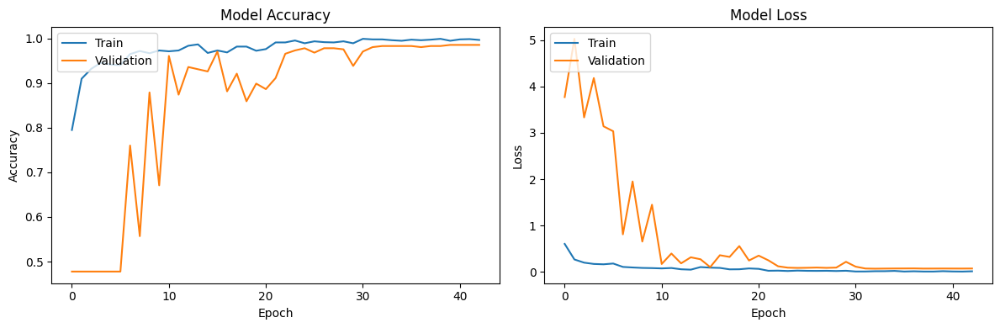

In [14]:


model = build_model()
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)
model.summary()

checkpoint = ModelCheckpoint(
    'ship_detection_model.h5',
    monitor='val_accuracy',
    save_best_only=True,
    mode='max',
    verbose=1
)

early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True,
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=50,
    batch_size=32,
    callbacks=[checkpoint, early_stopping, reduce_lr]
)

plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.savefig('training_history.png')
plt.show()

#**Part 7:Model Compilation, Training and Visualization**

This code cell handles the model compilation, training process, and visualization of training metrics:

Creates the model using the previously defined build_model() function
Compiles the model with Adam optimizer, categorical cross-entropy loss, and accuracy metric
Displays a summary of the model architecture
Sets up training callbacks:
ModelCheckpoint to save the best model based on validation accuracy
EarlyStopping to prevent overfitting by monitoring validation loss
ReduceLROnPlateau to adaptively decrease learning rate when progress plateaus
Trains the model for up to 50 epochs with a batch size of 32
Creates and saves visualizations of training and validation accuracy/loss curves
The training history plots provide visual feedback on the model's learning progress and help identify potential overfitting or underfitting issues.

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - accuracy: 0.9863 - loss: 0.0482
Test accuracy: 0.9827
Test loss: 0.0701
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


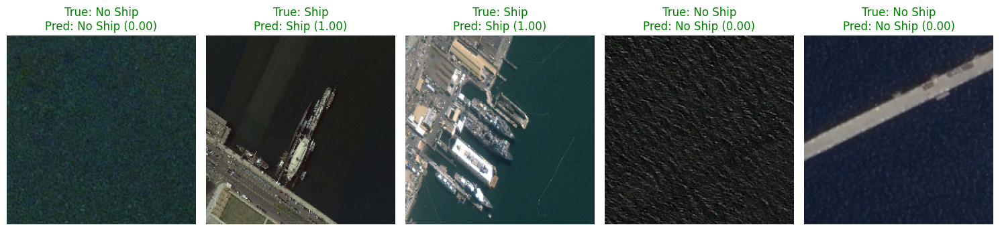

Model saved successfully!


In [15]:
test_loss, test_acc = model.evaluate(X_val, y_val)
print(f"Test accuracy: {test_acc:.4f}")
print(f"Test loss: {test_loss:.4f}")

def visualize_predictions(model, X, y_true, num_samples=5):
    indices = np.random.choice(range(len(X)), num_samples, replace=False)

    y_pred = model.predict(X[indices])
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(y_true[indices], axis=1)

    plt.figure(figsize=(15, 10))
    for i, idx in enumerate(indices):
        plt.subplot(1, num_samples, i+1)
        plt.imshow(X[idx])

        title = f"True: {'Ship' if y_true_classes[i] == 1 else 'No Ship'}\n"
        title += f"Pred: {'Ship' if y_pred_classes[i] == 1 else 'No Ship'} ({y_pred[i][1]:.2f})"

        color = 'green' if y_true_classes[i] == y_pred_classes[i] else 'red'
        plt.title(title, color=color)
        plt.axis('off')

    plt.tight_layout()
    plt.savefig('prediction_examples.png')
    plt.show()

visualize_predictions(model, X_val, y_val, num_samples=5)

model.save('ship_detection_final_model.h5')
print("Model saved successfully!")

def detect_ships(model, image_path, threshold=0.5, img_size=(224, 224)):
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w, _ = img.shape

    window_size = img_size
    stride = 112

    detections = []

    for y in range(0, h - window_size[0] + 1, stride):
        for x in range(0, w - window_size[1] + 1, stride):
            window = img_rgb[y:y + window_size[0], x:x + window_size[1]]

            window = cv2.resize(window, img_size)
            window = window / 255.0

            pred = model.predict(np.expand_dims(window, axis=0))[0]

            if pred[1] > threshold:
                detections.append((x, y, x + window_size[1], y + window_size[0], pred[1]))

    return detections, img_rgb

def non_max_suppression(boxes, overlapThresh):
    if len(boxes) == 0:
        return []

    boxes = np.array(boxes)

    x1 = boxes[:, 0]
    y1 = boxes[:, 1]
    x2 = boxes[:, 2]
    y2 = boxes[:, 3]
    scores = boxes[:, 4]

    area = (x2 - x1 + 1) * (y2 - y1 + 1)

    idxs = np.argsort(scores)

    pick = []

    while len(idxs) > 0:
        last = len(idxs) - 1
        i = idxs[last]
        pick.append(i)

        xx1 = np.maximum(x1[i], x1[idxs[:last]])
        yy1 = np.maximum(y1[i], y1[idxs[:last]])
        xx2 = np.minimum(x2[i], x2[idxs[:last]])
        yy2 = np.minimum(y2[i], y2[idxs[:last]])

        w = np.maximum(0, xx2 - xx1 + 1)
        h = np.maximum(0, yy2 - yy1 + 1)

        overlap = (w * h) / area[idxs[:last]]

        idxs = np.delete(idxs, np.concatenate(([last], np.where(overlap > overlapThresh)[0])))

    return boxes[pick].astype("int")



#**Part 8: Model Testing and Visualization**


This code cell implements testing functionality to evaluate the trained model on sample images:

Defines a test_on_sample function that:
Detects ships in a given image using the trained model
Applies non-maximum suppression to eliminate overlapping detections
Draws bounding boxes around detected ships with confidence scores
Displays and saves the visualization of detection results
Tests the model on a sample image from the validation set
Prints a success message upon completion
This testing phase demonstrates the model's ability to detect ships in satellite imagery by visualizing the detection results with bounding boxes and confidence scores. The function provides a practical way to qualitatively assess the model's performance on individual images.

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━

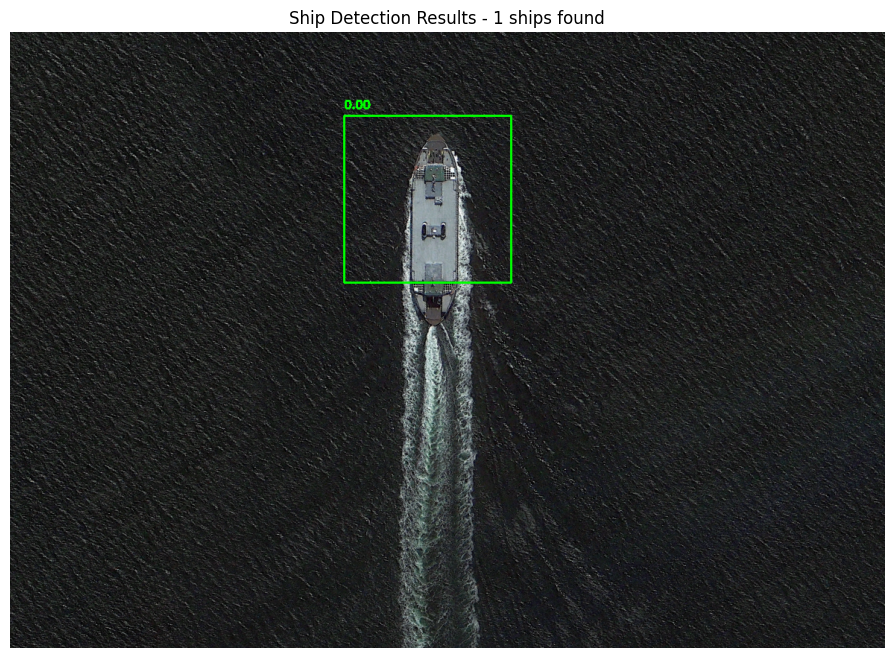

In [16]:
def test_on_sample(model, image_path):
    detections, img = detect_ships(model, image_path)

    if len(detections) > 0:
        detections = non_max_suppression(detections, 0.3)

    img_with_boxes = img.copy()
    for (x1, y1, x2, y2, score) in detections:
        cv2.rectangle(img_with_boxes, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(img_with_boxes, f"{score:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    plt.figure(figsize=(12, 8))
    plt.imshow(img_with_boxes)
    plt.title(f"Ship Detection Results - {len(detections)} ships found")
    plt.axis('off')
    plt.savefig('detection_result.png')
    plt.show()

if len(val_paths) > 0:
    sample_image_path = val_paths[0]
    if isinstance(sample_image_path, tuple):
        sample_image_path = sample_image_path[0]
    test_on_sample(model, sample_image_path)



#**Part 9: Ship Extraction and Visualization**


This code cell implements functionality to extract and visualize individual ships from the dataset:

Defines an extract_and_display_ships function that:
Randomly selects annotation files from the dataset
Extracts bounding box coordinates for ships in each image
Creates cropped images of individual ships with padding
Creates visualizations of both the original image (with bounding box) and the extracted ship
Organizes these visualizations in a side-by-side comparison
Calls the function to extract and display 10 ship samples
Saves the visualization to a file and returns the extracted ship images and their original contexts
This functionality provides a clear visual representation of how ships appear in the satellite imagery and how accurately the bounding box annotations capture them. It's useful for understanding the dataset characteristics and for qualitative assessment of the annotation quality.

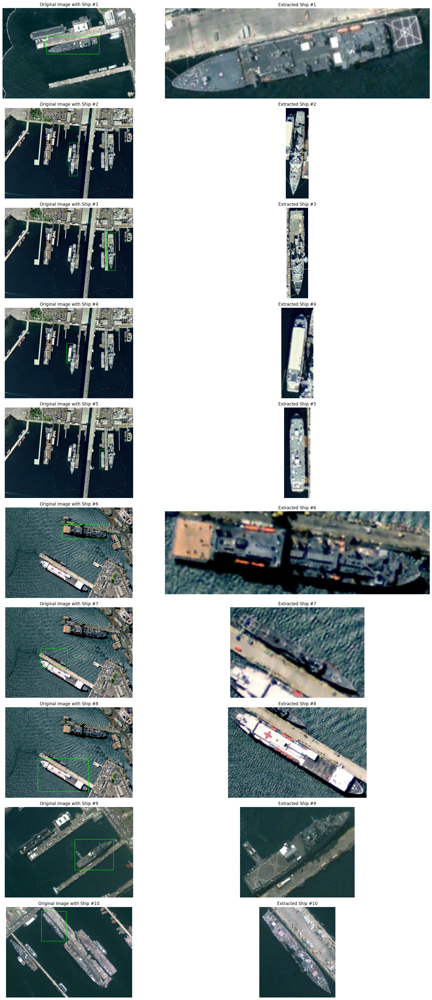

In [17]:
def extract_and_display_ships(num_samples=10):
    annotation_files = glob.glob(os.path.join(annotations_path, '*.xml'))
    np.random.shuffle(annotation_files)

    ship_images = []
    original_images = []

    count = 0
    for xml_file in annotation_files:
        if count >= num_samples:
            break

        img_file = os.path.join(images_path, os.path.basename(xml_file).replace('.xml', '.jpg'))
        if not os.path.exists(img_file):
            img_file = os.path.join(images_path, os.path.basename(xml_file).replace('.xml', '.bmp'))
            if not os.path.exists(img_file):
                continue

        boxes, img_width, img_height = parse_annotation(xml_file)

        if len(boxes) > 0:
            img = cv2.imread(img_file)
            if img is None:
                continue

            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            for box in boxes:
                xmin, ymin, xmax, ymax = box

                padding = 10
                xmin = max(0, xmin - padding)
                ymin = max(0, ymin - padding)
                xmax = min(img_width, xmax + padding)
                ymax = min(img_height, ymax + padding)

                ship_img = img_rgb[ymin:ymax, xmin:xmax]

                img_with_box = img_rgb.copy()
                cv2.rectangle(img_with_box, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)

                ship_images.append(ship_img)
                original_images.append(img_with_box)
                count += 1

                if count >= num_samples:
                    break

    plt.figure(figsize=(20, 4 * num_samples))
    for i in range(min(num_samples, len(ship_images))):
        plt.subplot(num_samples, 2, i*2 + 1)
        plt.imshow(original_images[i])
        plt.title(f"Original Image with Ship #{i+1}")
        plt.axis('off')

        plt.subplot(num_samples, 2, i*2 + 2)
        plt.imshow(ship_images[i])
        plt.title(f"Extracted Ship #{i+1}")
        plt.axis('off')

    plt.tight_layout()
    plt.savefig('extracted_ships.png')
    plt.show()

    return ship_images, original_images

ship_samples, original_contexts = extract_and_display_ships(num_samples=10)